# Final Project Submission
* Student name: Cindy King'ori
* Student pace: Part time
* Scheduled project review data/time: 23/10/2023, 6:00am
* Instructor name:Ms. Asha Deen
* Blog post URL:

# Tanzania Water Wells Conditions Project

## Project Overview/ Background
Tanzania, as a developing country with a population of over 57 million, faces significant challenges in providing clean and accessible water to its citizens. The country has established numerous water points; however, many of these water wells are in need of repair, and some have ceased functioning altogether. Access to clean and reliable water sources is vital for public health and economic development.

## Business Problem
The problem at hand pertains to a classification task focused on categorizing well conditions can be classified into three categories:
1. Functional - The well is in good working condition, currently in operational and good working condition, efficiently providing clean and reliable water to the local population.
2. Functional needs repair - The well is operational but requires maintenance or repai to ensure sustained functionality.
3. Non-functional - The well has stopped working, rendering them unproductive and incapable of providing water.

## Project Objective
The objective of this project is to develop a machine learning classifier to predict the condition of water wells in Tanzania. This predictive model will use various features and information related to these wells, such as the type of pump, installation date, and other relevant data. The primary audience for this project is an NGO focused on identifying and repairing non-functional wells as well as the Government of Tanzania, aiming to find patterns in non-operational wells to influence the construction of new ones.

## Project Methodology
The project will involve several key steps:
1. Data Collection: Gather a comprehensive dataset of water well information from various sources, including government records, surveys, and NGO databases.The data here is already available.

2. Data Preprocessing: Clean and prepare the data, which may involve handling missing values, encoding categorical variables, and normalizing or scaling features.

3. Feature Engineering: Create meaningful features from the raw data, potentially extracting additional information from the installation date, location, and other fields.

4. Model Building: Choose appropriate machine learning algorithms for classification, such as decision trees, random forests, or gradient boosting. Train the model using labeled data.

5. Model Evaluation: Assess the model's performance through metrics like accuracy, precision, recall, F1-score, and ROC AUC. Fine-tune the model as needed.

6. Deployment: Once the model is robust and accurate, it can be deployed in the field or integrated into a platform where users can input well data for prediction.

## Project Outcome
The project's outcomes include a predictive model that can classify water well conditions in Tanzania, helping stakeholders make informed decisions about which wells need repair or replacement. By deploying this model, NGOs and government agencies can better allocate resources to address the water supply challenges in the country, thereby improving the quality of life for the population.

This project has the potential to contribute significantly to the sustainable development goals of Tanzania and the global efforts to ensure access to clean water and sanitation for all.

## Data Understanding

An in-depth analysis of a dataset sourced from the Taarifa (http://taarifa.org/) open-source platform, the Tanzanian Water Ministry (http://maji.go.tz/), and publicly disseminated by Driven Data (https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/23/). This dataset comprises extensive information pertaining to approximately 60,000 water pumps distributed throughout Tanzania. It encompasses a comprehensive set of 39 distinct attributes, encompassing details related to the pumps' geographical locations, management aspects, and technical specifications.

Our analytical endeavor encompassed an exhaustive examination of 59,400 individual data points, incorporating a total of 39 attributes (columns) associated with water pumps situated in the Tanzanian context.

Datasets have been compiled organized as follows:

1. **Test Set Values**: This portion comprises the independent variables for which predictions are required. It contains the data for which the model's predictions will be generated.

2. **Training Set Labels**: This component contains the dependent variable, namely "status_group," which represents the target variable or the desired outcome for each corresponding row in the "Training Set Values." It essentially provides the ground truth for the model to learn from during training.

3. **Training Set Values**: This segment encompasses the independent variables associated with the training set. It contains the features and attributes that the machine learning model will utilize for training and predicting the "status_group" variable.

These datasets are fundamental for building and evaluating predictive models to address the water pump conditions in Tanzania.

The dataset consists of the following features:

**amount_tsh**: Total static head (amount water available to waterpoint)

**date_recorded**: The date when the data was recorded
 
**funder:** The organization or entity that funded the well
 
**gps_height:** The altitude of the well
 
**installer:** The organization responsible for installing the well
 
**longitude:** GPS coordinate of the well's location
 
**latitude:** GPS coordinate of the well's location

**wpt_name:** The name of the waterpoint (if applicable)

**basin:** The geographic water basin where the well is located

**subvillage:** The geographic location of the well (subvillage)

**region:** The geographic location of the well (region)

**region_code:** Coded representation of the geographic region

**district_code:** Coded representation of the district

**lga:** The local government authority responsible for the area

**ward:** The administrative ward where the well is located

**population:** The population size around the well

**public_meeting:** A boolean indicating if there was a public meeting to discuss the waterpoint

**recorded_by:** The group or organization that recorded the data

**scheme_management:** The entity responsible for managing the waterpoint

**permit:** Indicates if the waterpoint has the necessary permits

**construction_year:** The year when the waterpoint was constructed

**extraction_type:** The method used to extract water from the waterpoint

**management:** How the waterpoint is managed

**payment_type:** The type of payment required for accessing the water

**water_quality:** The quality of the water from the waterpoint

**quantity:** The quantity of water available from the waterpoint

**source_type:** The source type of the waterpoint

**source_class:** The source class of the waterpoint

**waterpoint_type:** The type or category of the waterpoint

## Data Preparation and Cleaning

### Importing the libraries

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
from scipy import stats
import numpy as np
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.impute import KNNImputer
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn import svm
from sklearn.metrics import f1_score, balanced_accuracy_score, plot_confusion_matrix, classification_report

# Show all columns (instead of cascading columns in the middle)
pd.set_option("display.max_columns", None)
pd.set_option('display.max_colwidth', None)
# Don't show numbers as scientific notation
pd.set_option("display.float_format", "{:.2f}".format)

%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [2]:
# Import the 3 datasets provided
test_set_values = pd.read_csv('Test set values.csv')
training_set_labels = pd.read_csv('Training Set labels.csv')
training_set_values = pd.read_csv('Training set Values.csv')

In [3]:
# Summary of the shape of the datasets above
def print_dataset_shape(*datasets):
    for idx, dataset in enumerate(datasets):
        print(f"Dataset {idx + 1} - Number of rows: {dataset.shape[0]}")
        print(f"Dataset {idx + 1} - Number of columns: {dataset.shape[1]}")
print_dataset_shape(test_set_values, training_set_labels, training_set_values)

Dataset 1 - Number of rows: 14850
Dataset 1 - Number of columns: 40
Dataset 2 - Number of rows: 59400
Dataset 2 - Number of columns: 2
Dataset 3 - Number of rows: 59400
Dataset 3 - Number of columns: 40


- **Test Set Values**: This dataset comprises the independent variables or features specific to the test set. It is instrumental in generating predictions for the target variable.

- **Training Set Labels**: This dataset includes the dependent variable, referred to as "status_group," for each entry within the training set values. It denotes the current operational status of the waterpoints, serving as the benchmark for model training and evaluation.

- **Training Set Values**: This dataset encompasses the independent variables or features pertinent to the training set. These attributes play a pivotal role in the training of the predictive model.

In [4]:
# Summary statistics of the training set values
training_set_values.describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.00,59400.00,59400.00,59400.00,59400.00,59400.00,59400.00,59400.00,59400.00,59400.00
mean,37115.13,317.65,668.30,34.08,-5.71,0.47,15.30,5.63,179.91,1300.65
std,21453.13,2997.57,693.12,6.57,2.95,12.24,17.59,9.63,471.48,951.62
min,0.00,0.00,-90.00,0.00,-11.65,0.00,1.00,0.00,0.00,0.00
25%,18519.75,0.00,0.00,33.09,-8.54,0.00,5.00,2.00,0.00,0.00
50%,37061.50,0.00,369.00,34.91,-5.02,0.00,12.00,3.00,25.00,1986.00
75%,55656.50,20.00,1319.25,37.18,-3.33,0.00,17.00,5.00,215.00,2004.00
max,74247.00,350000.00,2770.00,40.35,-0.00,1776.00,99.00,80.00,30500.00,2013.00


In [5]:
# Look at the info in the training_set_values dataset to check for missing values and the type of data
training_set_values.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 55765 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              55745 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59400 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59029 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

The baseline amount of data is 59400 entries but there are some columns with missing values namely:
* funder 
* installer
* subvillage 
* public_meeting 
* scheme_management
* scheme_name 
* permit

All columns are in the correct form, meaning there is no need for changing the format.

In [6]:
# Look at info in the training set bales dataset
training_set_labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59400 entries, 0 to 59399
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id            59400 non-null  int64 
 1   status_group  59400 non-null  object
dtypes: int64(1), object(1)
memory usage: 928.2+ KB


In [7]:
# Distribution of the target variable in the training set labels dataset
training_set_labels['status_group'].value_counts()

functional                 32259
non functional             22824
functional needs repair     4317
Name: status_group, dtype: int64

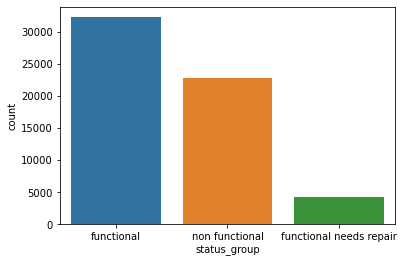

In [8]:
# Visualisation of the distrivution above
sns.countplot(x='status_group', data=training_set_labels)
plt.show()

The dataset primarily comprises water pumps categorized as 'functional,' indicating a substantial portion of the pumps are currently in good operational condition.

Within the dataset, the 'non-functional' category exhibits a notable count, though it is fewer than the 'functional' ones. This observation underscores the presence of a significant proportion of non-operational or non-working water pumps.

Conversely, the 'functional needs repair' category records the lowest count, signifying that there are relatively fewer pumps that are currently operational but in need of repair.

In [9]:
# Look at the percentages of the Status Group per column
training_set_labels.status_group.value_counts()/len(training_set_labels.status_group)

functional                0.54
non functional            0.38
functional needs repair   0.07
Name: status_group, dtype: float64

Based on the dataset, it is observed that around 54% of the pumps are in 'Functional' condition, approximately 38% are 'Non-Functional,' and a smaller percentage, approximately 7%, are 'Functional but in need of repair.'

#### Missing Values Check

In [10]:

#First check for missing values
#Training set values
print("Missing values in Training Set Values:")
print(training_set_values.isnull().sum())

# Training set labels
print("\nMissing values in Training Set Labels:")
print(training_set_labels.isnull().sum())

# Test set values
print("\nMissing values in Test Set Values:")
print(test_set_values.isnull().sum())

Missing values in Training Set Values:
id                           0
amount_tsh                   0
date_recorded                0
funder                    3635
gps_height                   0
installer                 3655
longitude                    0
latitude                     0
wpt_name                     0
num_private                  0
basin                        0
subvillage                 371
region                       0
region_code                  0
district_code                0
lga                          0
ward                         0
population                   0
public_meeting            3334
recorded_by                  0
scheme_management         3877
scheme_name              28166
permit                    3056
construction_year            0
extraction_type              0
extraction_type_group        0
extraction_type_class        0
management                   0
management_group             0
payment                      0
payment_type                 0


Depending on the dataset, there are columns with missing values and they all need to be addressed.

In [11]:
from sklearn.impute import SimpleImputer

# Impute categorical columns by replacing missing values with the most frequent mode.
categorical_cols = ['funder', 'installer', 'public_meeting', 'scheme_management', 'scheme_name', 'permit']
categorical_imputer = SimpleImputer(strategy='most_frequent')
training_set_values[categorical_cols] = categorical_imputer.fit_transform(training_set_values[categorical_cols])
test_set_values[categorical_cols] = categorical_imputer.fit_transform(test_set_values[categorical_cols])

# Impute non-categorical columns using a constant value.
non_categorical_cols = ['date_recorded', 'subvillage']
constant_imputer = SimpleImputer(strategy='constant', fill_value='Missing')
training_set_values[non_categorical_cols] = constant_imputer.fit_transform(training_set_values[non_categorical_cols])
test_set_values[non_categorical_cols] = constant_imputer.fit_transform(test_set_values[non_categorical_cols])

In [12]:
# Validate the completion of missing value handling.
print("\nMissing values after imputation in Training Set Values:")
print(training_set_values.isnull().sum())

print("\nMissing values after imputation in Test Set Values:")
print(test_set_values.isnull().sum())


Missing values after imputation in Training Set Values:
id                       0
amount_tsh               0
date_recorded            0
funder                   0
gps_height               0
installer                0
longitude                0
latitude                 0
wpt_name                 0
num_private              0
basin                    0
subvillage               0
region                   0
region_code              0
district_code            0
lga                      0
ward                     0
population               0
public_meeting           0
recorded_by              0
scheme_management        0
scheme_name              0
permit                   0
construction_year        0
extraction_type          0
extraction_type_group    0
extraction_type_class    0
management               0
management_group         0
payment                  0
payment_type             0
water_quality            0
quality_group            0
quantity                 0
quantity_group           

The datasets above show that all the missing values have been dealt with and no longer exist.

#### Duplicates Check

In [13]:
def check_duplicates(*datasets):
    for idx, dataset in enumerate(datasets):
        num_duplicates = dataset.duplicated().sum()
        print(f"Number of duplicates in Dataset {idx + 1}: {num_duplicates}")

check_duplicates(test_set_values, training_set_labels, training_set_values)

Number of duplicates in Dataset 1: 0
Number of duplicates in Dataset 2: 0
Number of duplicates in Dataset 3: 0


The above shows that there is no existence of duplicates.

In [14]:
# Merge the training set values and the training set labels for a more comprehensive dataframe
training_df = pd.merge(training_set_values, training_set_labels, on='id')

In [15]:
training_df

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.00,2011-03-14,Roman,1390,Roman,34.94,-9.86,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.00,2013-03-06,Grumeti,1399,GRUMETI,34.70,-2.15,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,True,GeoData Consultants Ltd,Other,K,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.00,2013-02-25,Lottery Club,686,World vision,37.46,-3.82,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.00,2013-01-28,Unicef,263,UNICEF,38.49,-11.16,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,K,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.00,2011-07-13,Action In A,0,Artisan,31.13,-1.83,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,VWC,K,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,60739,10.00,2013-05-03,Germany Republi,1210,CES,37.17,-3.25,Area Three Namba 27,0,Pangani,Kiduruni,Kilimanjaro,3,5,Hai,Masama Magharibi,125,True,GeoData Consultants Ltd,Water Board,Losaa Kia water supply,True,1999,gravity,gravity,gravity,water board,user-group,pay per bucket,per bucket,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
59396,27263,4700.00,2011-05-07,Cefa-njombe,1212,Cefa,35.25,-9.07,Kwa Yahona Kuvala,0,Rufiji,Igumbilo,Iringa,11,4,Njombe,Ikondo,56,True,GeoData Consultants Ltd,VWC,Ikondo electrical water sch,True,1996,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,functional
59397,37057,0.00,2011-04-11,Government Of Tanzania,0,DWE,34.02,-8.75,Mashine,0,Rufiji,Madungulu,Mbeya,12,7,Mbarali,Chimala,0,True,GeoData Consultants Ltd,VWC,K,False,0,swn 80,swn 80,handpump,vwc,user-group,pay monthly,monthly,fluoride,fluoride,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump,functional
59398,31282,0.00,2011-03-08,Malec,0,Musa,35.86,-6.38,Mshoro,0,Rufiji,Mwinyi,Dodoma,1,4,Chamwino,Mvumi Makulu,0,True,GeoData Consultants Ltd,VWC,K,True,0,nira/tanira,nira/tanira,handpump,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,functional


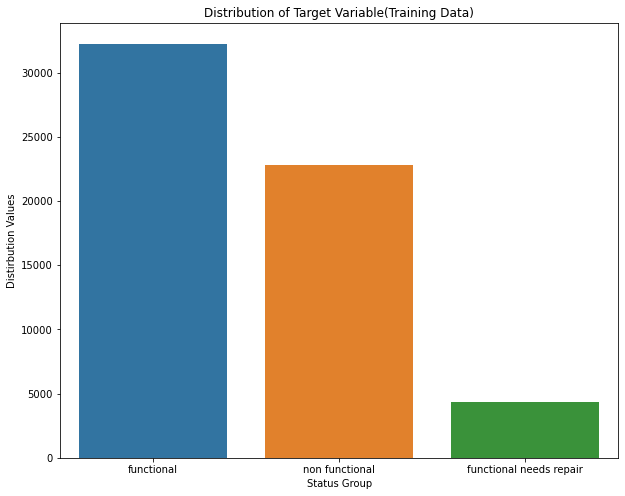

In [16]:
# Visualise the new dataframe training_df
plt.figure(figsize=(10, 8))
sns.countplot(x='status_group', data=training_df)
plt.title('Distribution of Target Variable(Training Data)')
plt.xlabel('Status Group')
plt.ylabel('Distirbution Values')
plt.show()

#### Check for outliers

In [17]:
# Here we check for outliers in the numerical columns
numeric_columns = training_df.select_dtypes(include=['float', 'int', 'int64']).columns
numeric_columns

Index(['id', 'amount_tsh', 'gps_height', 'longitude', 'latitude',
       'num_private', 'region_code', 'district_code', 'population',
       'construction_year'],
      dtype='object')

In [18]:
# Calculate z-scores for numerical features

z_scores = np.abs((training_df[numeric_columns] - training_df[numeric_columns].mean()) / training_df[numeric_columns].std())

# Identify outliers based on z-score threshold

z_score_threshold = 3

outliers = (z_scores > z_score_threshold).any(axis=1)

# Print the number of outliers

print("Number of outliers:", outliers.sum())

Number of outliers: 6363


In [19]:
# calculating the percentage of outliers
percentage_outliers = (outliers.sum() / len(training_df)) * 100

print(f"Percentage of outliers: {percentage_outliers:.2f}%")


Percentage of outliers: 10.71%


Approximately 10.71% of the records in our dataset exhibit outliers. Given that this proportion does not exceed 50% of our dataset, we may consider discarding these records with confidence. However, as a precautionary measure, we will retain them temporarily to assess whether their presence has any adverse effects on our model's performance.

### Exploratory Data Analysis

In [20]:
training_df.describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,59400.00,59400.00,59400.00,59400.00,59400.00,59400.00,59400.00,59400.00,59400.00,59400.00
mean,37115.13,317.65,668.30,34.08,-5.71,0.47,15.30,5.63,179.91,1300.65
std,21453.13,2997.57,693.12,6.57,2.95,12.24,17.59,9.63,471.48,951.62
min,0.00,0.00,-90.00,0.00,-11.65,0.00,1.00,0.00,0.00,0.00
25%,18519.75,0.00,0.00,33.09,-8.54,0.00,5.00,2.00,0.00,0.00
50%,37061.50,0.00,369.00,34.91,-5.02,0.00,12.00,3.00,25.00,1986.00
75%,55656.50,20.00,1319.25,37.18,-3.33,0.00,17.00,5.00,215.00,2004.00
max,74247.00,350000.00,2770.00,40.35,-0.00,1776.00,99.00,80.00,30500.00,2013.00


The provided insights are derived from statistics on the dataset columns: `id`, `amount_tsh`, `gps_height`, `longitude`, `latitude`, `num_private`, `region_code`, `district_code`, `population`, and `construction_year`. These statistics provide a summary of the distribution and characteristics of each column. Here's what these insights reveal:

1. **Count**: There are 59,400 records in the dataset for each of the columns, suggesting that there are no missing values.

2. **Mean**: The mean represents the average value for each column. For example, the average `amount_tsh` (total static head) is approximately 317.65, while the mean `construction_year` is about 1300.65.

3. **Standard Deviation (Std)**: The standard deviation measures the dispersion or spread of the values within each column. A higher standard deviation indicates greater variability. For example, the `amount_tsh` has a relatively high standard deviation of about 2997.57, suggesting significant variability in this feature.

4. **Minimum (Min)**: This is the smallest value in each column. For instance, the minimum `gps_height` is -90, and the minimum `latitude` is -11.65.

5. **25th Percentile (Q1)**: This is the value below which 25% of the data falls. For example, the 25th percentile for `amount_tsh` is 0, indicating that a quarter of the values are zero or very close to zero.

6. **50th Percentile (Median, Q2)**: This is the median or middle value in each column. For instance, the median `construction_year` is 1986, suggesting that half of the construction years fall before this year.

7. **75th Percentile (Q3)**: This represents the value below which 75% of the data falls. For example, the 75th percentile for `amount_tsh` is 20, indicating that 75% of the values are 20 or less.

8. **Maximum (Max)**: This is the largest value in each column. For example, the maximum `amount_tsh` is 350,000, and the maximum `construction_year` is 2013.

These insights provide an understanding of the central tendencies, spread, and range of the data in each column, which is valuable for data analysis, visualization, and modeling. They also help identify potential outliers and assess the data's overall distribution.

#### Univariate Analysis

In [21]:
training_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 59400 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              59400 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59400 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59400 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

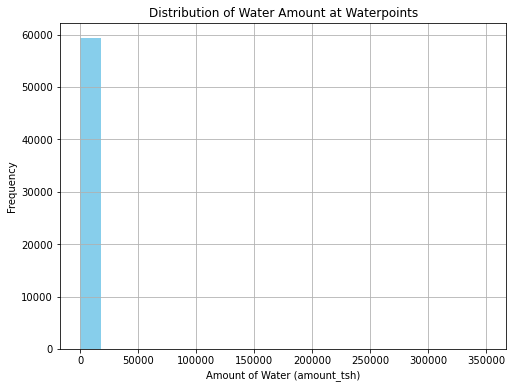

In [22]:
# Visualise the amount of water available to waterpoint using columns amount_tsh
plt.figure(figsize=(8, 6))
plt.hist(training_df['amount_tsh'], bins=20, color='skyblue')
plt.title('Distribution of Water Amount at Waterpoints')
plt.xlabel('Amount of Water (amount_tsh)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

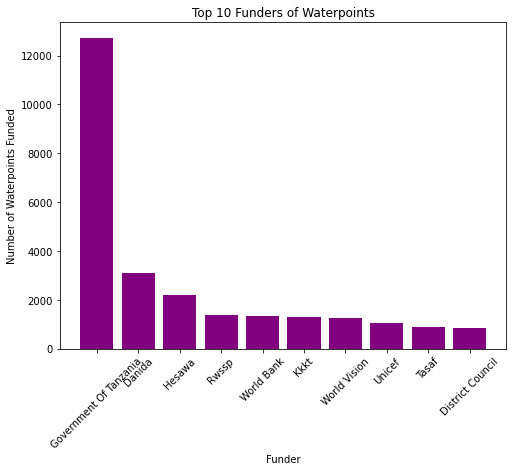

In [23]:
# Visualise the funder  using the funder column
plt.figure(figsize=(8, 6))
plt.bar(training_df['funder'].value_counts().index[:10], training_df['funder'].value_counts()[:10], color='purple')
plt.title('Top 10 Funders of Waterpoints')
plt.xlabel('Funder')
plt.ylabel('Number of Waterpoints Funded')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

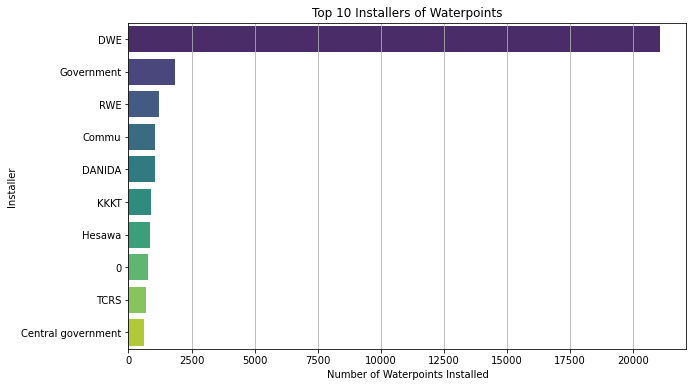

In [24]:
# Visualise the installer using the installer column
plt.figure(figsize=(10, 6))
top_installers = training_df['installer'].value_counts().head(10)
sns.barplot(x=top_installers, y=top_installers.index, palette="viridis")
plt.title('Top 10 Installers of Waterpoints')
plt.xlabel('Number of Waterpoints Installed')
plt.ylabel('Installer')
plt.grid(axis='x')
plt.show()

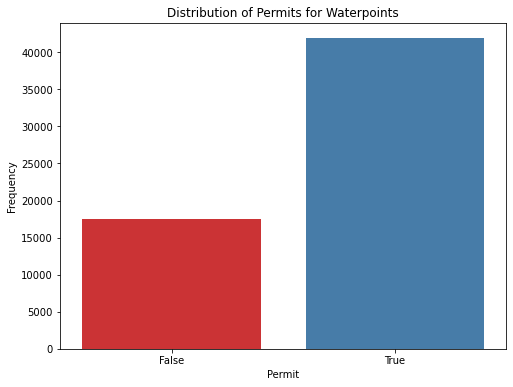

In [25]:
# Visualise the permit using the permit column
plt.figure(figsize=(8, 6))
sns.countplot(data=training_df, x='permit', palette="Set1")
plt.title('Distribution of Permits for Waterpoints')
plt.xlabel('Permit')
plt.ylabel('Frequency')
plt.show()

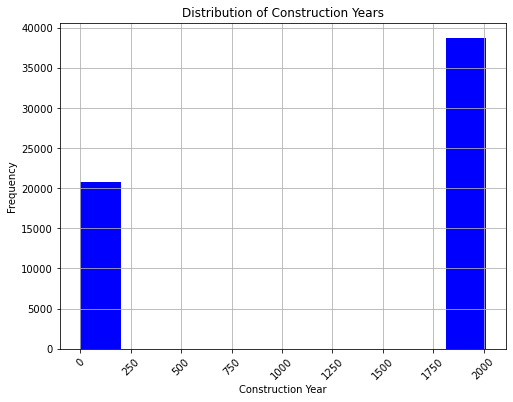

In [26]:
# Visualise the construction_year using the construction_year column
plt.figure(figsize=(8, 6))
plt.hist(training_df['construction_year'], bins=10, color='blue')
plt.title('Distribution of Construction Years')
plt.xlabel('Construction Year')
plt.ylabel('Frequency')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

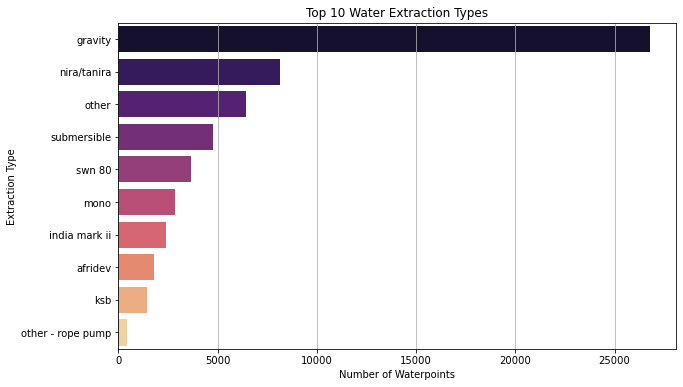

In [27]:
# Visualise the extraction_type using the extraction_type column
plt.figure(figsize=(10, 6))
top_extraction_types = training_df['extraction_type'].value_counts().head(10)
sns.barplot(x=top_extraction_types, y=top_extraction_types.index, palette="magma")
plt.title('Top 10 Water Extraction Types')
plt.xlabel('Number of Waterpoints')
plt.ylabel('Extraction Type')
plt.grid(axis='x')
plt.show()

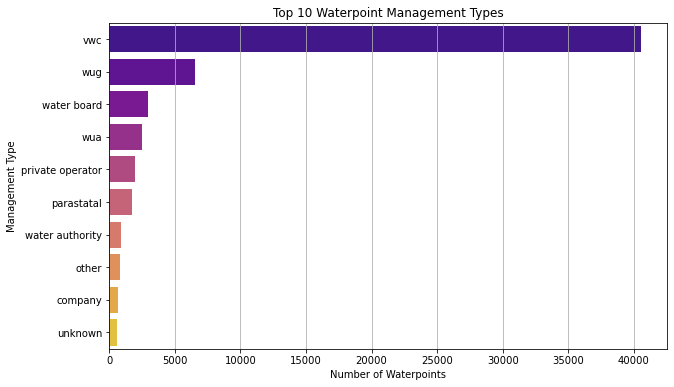

In [28]:
# Visualise the management using the management column
plt.figure(figsize=(10, 6))
top_management = training_df['management'].value_counts().head(10)
sns.barplot(x=top_management, y=top_management.index, palette="plasma")
plt.title('Top 10 Waterpoint Management Types')
plt.xlabel('Number of Waterpoints')
plt.ylabel('Management Type')
plt.grid(axis='x')
plt.show()

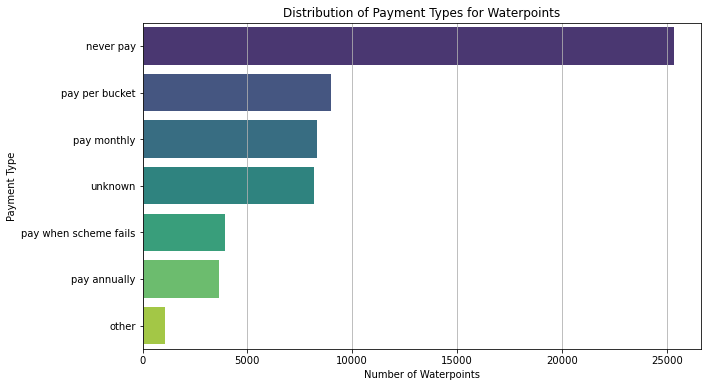

In [29]:
# Visualise the payment using the payment column
plt.figure(figsize=(10, 6))
payment_counts = training_df['payment'].value_counts()
sns.barplot(x=payment_counts, y=payment_counts.index, palette="viridis")
plt.title('Distribution of Payment Types for Waterpoints')
plt.xlabel('Number of Waterpoints')
plt.ylabel('Payment Type')
plt.grid(axis='x')
plt.show()

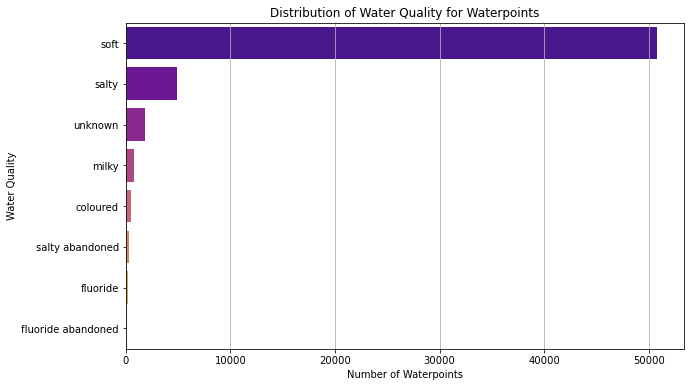

In [30]:
# Visualise the water_quality using the water_quality column
plt.figure(figsize=(10, 6))
water_quality_counts = training_df['water_quality'].value_counts()
sns.barplot(x=water_quality_counts, y=water_quality_counts.index, palette="plasma")
plt.title('Distribution of Water Quality for Waterpoints')
plt.xlabel('Number of Waterpoints')
plt.ylabel('Water Quality')
plt.grid(axis='x')
plt.show()

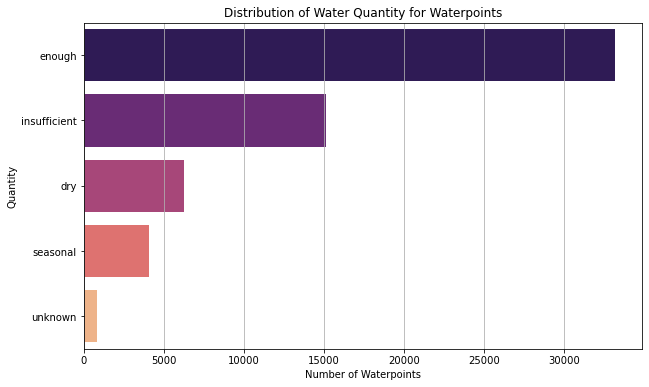

In [31]:
# Visualise the quantity using the quantity column
plt.figure(figsize=(10, 6))
quantity_counts = training_df['quantity'].value_counts()
sns.barplot(x=quantity_counts, y=quantity_counts.index, palette="magma")
plt.title('Distribution of Water Quantity for Waterpoints')
plt.xlabel('Number of Waterpoints')
plt.ylabel('Quantity')
plt.grid(axis='x')
plt.show()

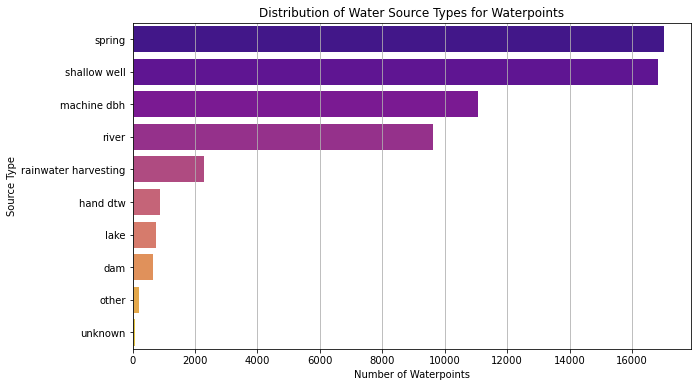

In [32]:
# Visualise the source using the source column
plt.figure(figsize=(10, 6))
source_counts = training_df['source'].value_counts()
sns.barplot(x=source_counts, y=source_counts.index, palette="plasma")
plt.title('Distribution of Water Source Types for Waterpoints')
plt.xlabel('Number of Waterpoints')
plt.ylabel('Source Type')
plt.grid(axis='x')
plt.show()

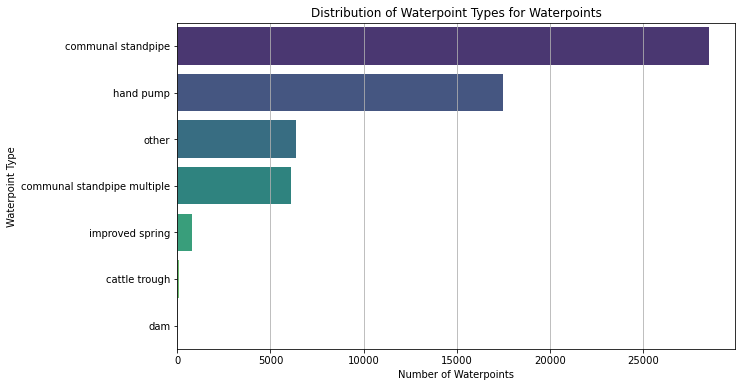

In [33]:
# Visualise the waterpoint_type using the waterpoint_type column
plt.figure(figsize=(10, 6))
waterpoint_type_counts = training_df['waterpoint_type'].value_counts()
sns.barplot(x=waterpoint_type_counts, y=waterpoint_type_counts.index, palette="viridis")
plt.title('Distribution of Waterpoint Types for Waterpoints')
plt.xlabel('Number of Waterpoints')
plt.ylabel('Waterpoint Type')
plt.grid(axis='x')
plt.show()

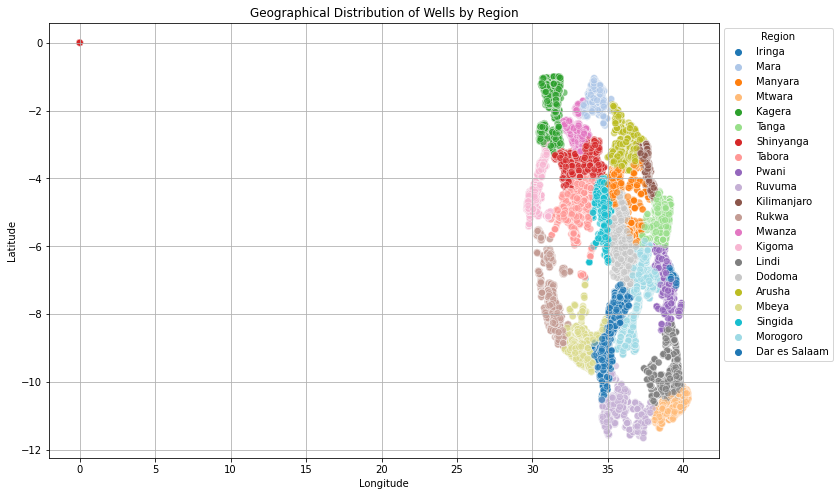

In [34]:
#Visualise a map of the region of the wells using the region column using a map scatterplot to show the geographical area
plt.figure(figsize=(12, 8))
sns.scatterplot(x='longitude', y='latitude', data=training_df, hue='region', palette='tab20', s=50, alpha=0.6)
plt.title('Geographical Distribution of Wells by Region')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Region', bbox_to_anchor=(1, 1), loc='upper left')
plt.grid()
plt.show()

#### Bivariate Analysis

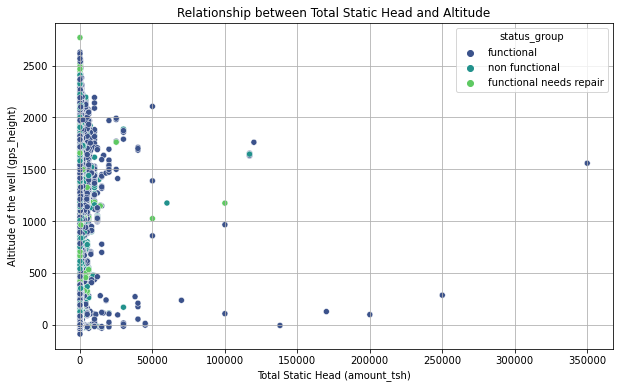

In [35]:
# Relationship between amount_tsh (Total static head) vs. gps_height (Altitude of the well): 
# Investigating whether the total static head varies with the altitude of the well
plt.figure(figsize=(10, 6))
sns.scatterplot(data=training_df, x='amount_tsh', y='gps_height', hue='status_group', palette='viridis')
plt.title('Relationship between Total Static Head and Altitude')
plt.xlabel('Total Static Head (amount_tsh)')
plt.ylabel('Altitude of the well (gps_height)')
plt.grid()
plt.show()

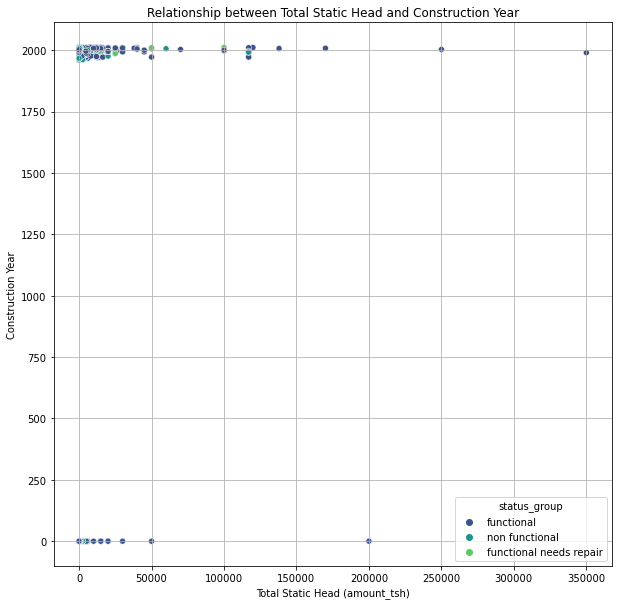

In [36]:
# Relationship between amount_tsh vs. construction_year: 
# Analyzing the relationship between the total static head and the year the waterpoint was constructed.
plt.figure(figsize=(10, 10))
sns.scatterplot(data=training_df, x='amount_tsh', y='construction_year', hue='status_group', palette='viridis')
plt.title('Relationship between Total Static Head and Construction Year')
plt.xlabel('Total Static Head (amount_tsh)')
plt.ylabel('Construction Year')
plt.grid()

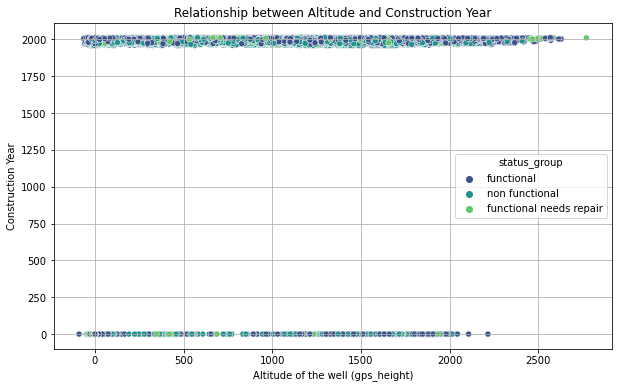

In [37]:
# Relationship between gps_height vs. construction_year: 
# Exploring how the altitude of the well relates to the year of construction
plt.figure(figsize=(10, 6))
sns.scatterplot(data=training_df, x='gps_height', y='construction_year', hue='status_group', palette='viridis')
plt.title('Relationship between Altitude and Construction Year')
plt.xlabel('Altitude of the well (gps_height)')
plt.ylabel('Construction Year')
plt.grid()
plt.show()

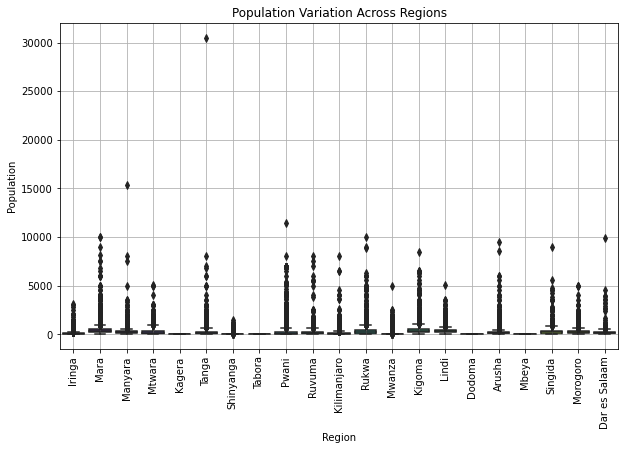

In [38]:
# Relationship between population vs. region: 
# Understanding how the population around the well varies across different geographic regions
plt.figure(figsize=(10, 6))
sns.boxplot(data=training_df, x='region', y='population', palette='viridis')
plt.title('Population Variation Across Regions')
plt.xlabel('Region')
plt.ylabel('Population')
plt.xticks(rotation=90)
plt.grid()
plt.show()

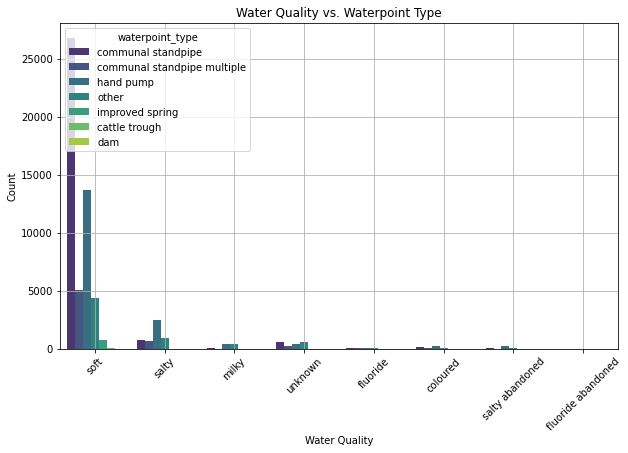

In [39]:
# Relationship between water_quality vs. waterpoint_type: 
# Investigating the quality of water in different types of waterpoints.
plt.figure(figsize=(10, 6))
sns.countplot(data=training_df, x='water_quality', hue='waterpoint_type', palette='viridis')
plt.title('Water Quality vs. Waterpoint Type')
plt.xlabel('Water Quality')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid()
plt.show()

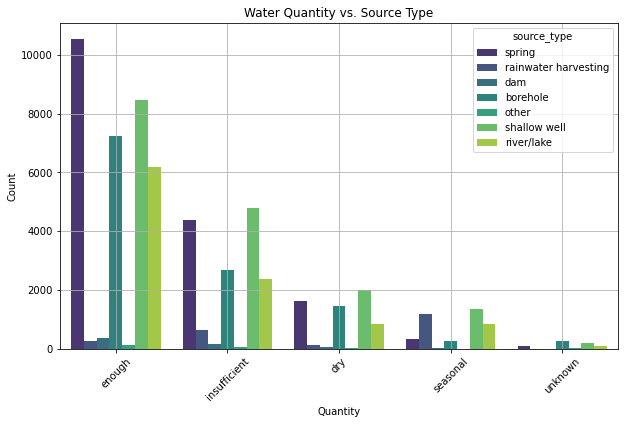

In [40]:
# Relationship between quantity vs. source_type: 
# Analyzing the quantity of water supplied in relation to the source type.
plt.figure(figsize=(10, 6))
sns.countplot(data=training_df, x='quantity', hue='source_type', palette='viridis')
plt.title('Water Quantity vs. Source Type')
plt.xlabel('Quantity')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid()
plt.show()

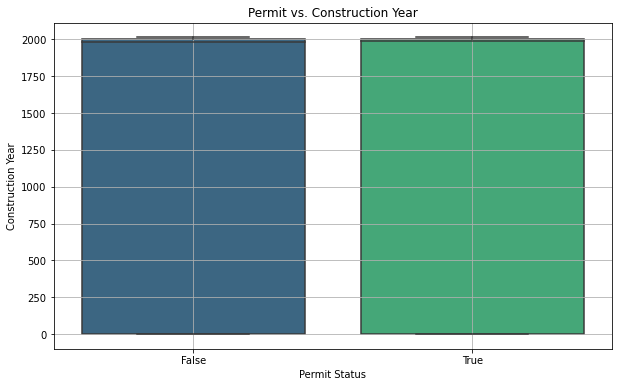

In [41]:
# Relationship between permit vs. construction_year: 
# Examining whether waterpoints are permitted and how it relates to the year of construction.
plt.figure(figsize=(10, 6))
sns.boxplot(data=training_df, x='permit', y='construction_year', palette='viridis')
plt.title('Permit vs. Construction Year')
plt.xlabel('Permit Status')
plt.ylabel('Construction Year')
plt.grid()
plt.show()

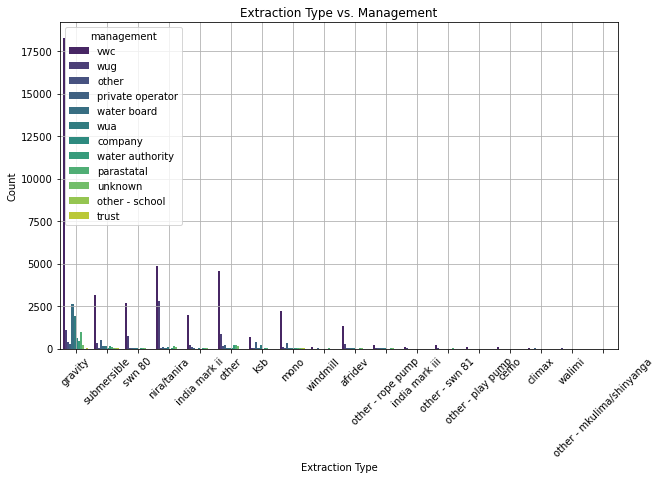

In [42]:
# Relationship between extraction_type vs. management: 
#Exploring how the extraction type is managed.
plt.figure(figsize=(10, 6))
sns.countplot(data=training_df, x='extraction_type', hue='management', palette='viridis')
plt.title('Extraction Type vs. Management')
plt.xlabel('Extraction Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid()
plt.show()

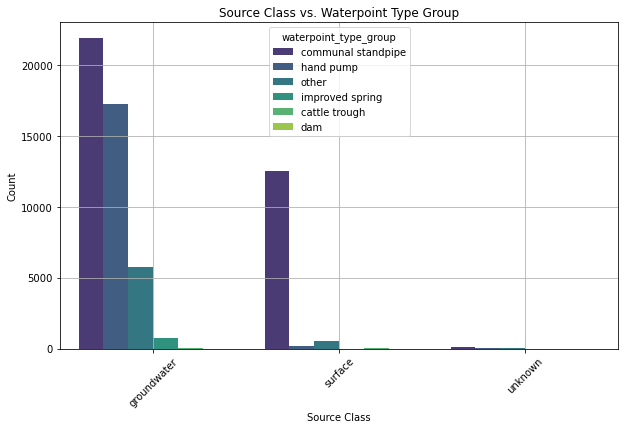

In [43]:
# Relationship between source_class vs. waterpoint_type_group: 
# Investigating the source class in relation to the waterpoint type group.
plt.figure(figsize=(10, 6))
sns.countplot(data=training_df, x='source_class', hue='waterpoint_type_group', palette='viridis')
plt.title('Source Class vs. Waterpoint Type Group')
plt.xlabel('Source Class')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid()
plt.show()

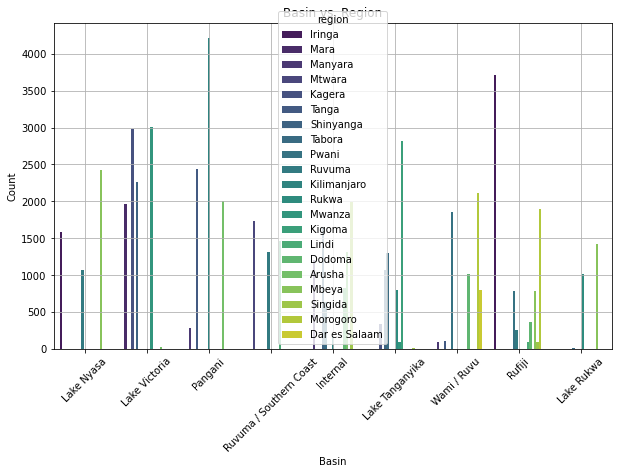

In [44]:
# Relationship between basin vs. region: 
# Analyzing how the geographic water basin relates to different regions.
plt.figure(figsize=(10, 6))
sns.countplot(data=training_df, x='basin', hue='region', palette='viridis')
plt.title('Basin vs. Region')
plt.xlabel('Basin')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid()
plt.show()

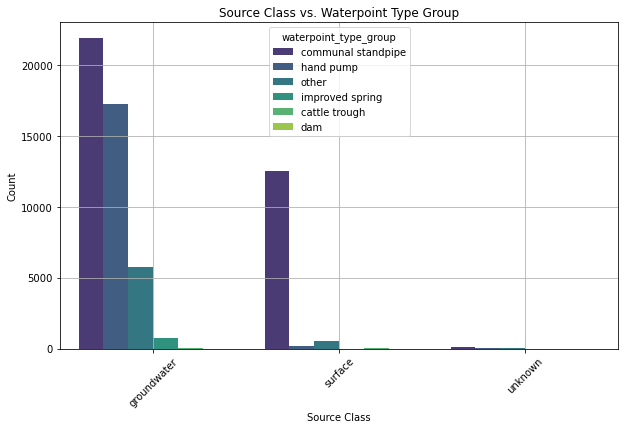

In [45]:
# Relationship between source_class vs. waterpoint_type_group: 
#Investigating the source class in relation to the waterpoint type group.
plt.figure(figsize=(10, 6))
sns.countplot(data=training_df, x='source_class', hue='waterpoint_type_group', palette='viridis')
plt.title('Source Class vs. Waterpoint Type Group')
plt.xlabel('Source Class')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid()
plt.show()

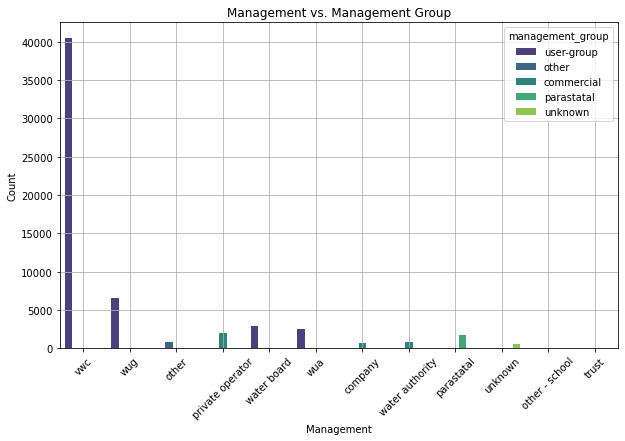

In [46]:
# Relationship between management vs. management_group: 
# Exploring the specific management methods within broader management groups.
plt.figure(figsize=(10, 6))
sns.countplot(data=training_df, x='management', hue='management_group', palette='viridis')
plt.title('Management vs. Management Group')
plt.xlabel('Management')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid()
plt.show()

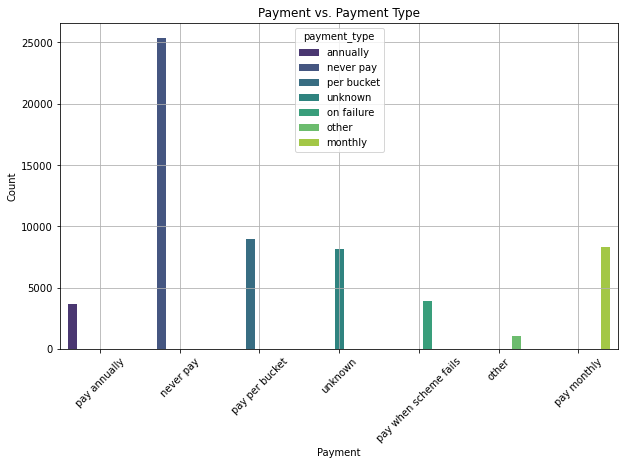

In [47]:
# Relationship between payment vs. payment_type: 
# Understanding how payment methods align with payment types.
plt.figure(figsize=(10, 6))
sns.countplot(data=training_df, x='payment', hue='payment_type', palette='viridis')
plt.title('Payment vs. Payment Type')
plt.xlabel('Payment')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid()
plt.show()

In [48]:
# Use a map scatterplot to show the geographical area using the latitude and longitude columns
import plotly.express as px
fig = px.scatter_mapbox(training_df, lat="latitude", lon="longitude", color="basin", hover_name="region",
                        title='Geographical Distribution of Basins by Region',
                        mapbox_style="carto-positron")
fig.show()

#### Multivariate Analysis

Check for correlation among the variables

In [49]:
correlation_matrix = training_df.corr()

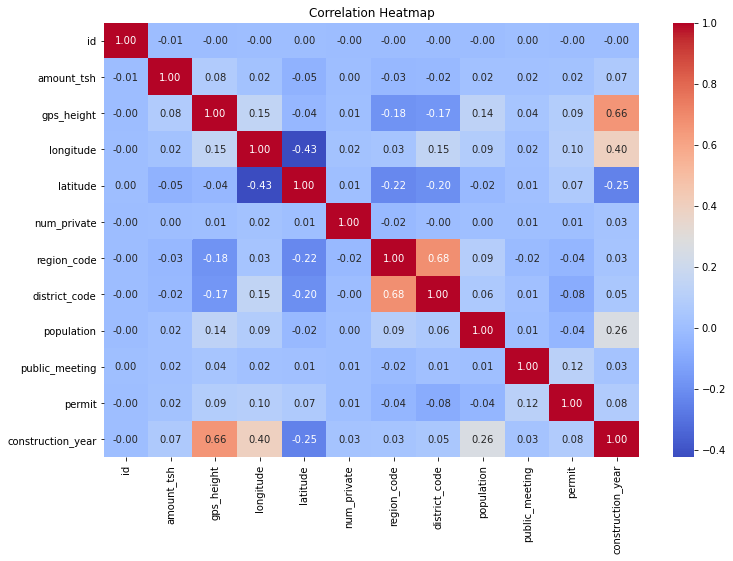

In [50]:
# Create a heatmap to visualize the correlation
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

### Feature Engineering

In [51]:
# List the columns in the dataset
training_df.columns

Index(['id', 'amount_tsh', 'date_recorded', 'funder', 'gps_height',
       'installer', 'longitude', 'latitude', 'wpt_name', 'num_private',
       'basin', 'subvillage', 'region', 'region_code', 'district_code', 'lga',
       'ward', 'population', 'public_meeting', 'recorded_by',
       'scheme_management', 'scheme_name', 'permit', 'construction_year',
       'extraction_type', 'extraction_type_group', 'extraction_type_class',
       'management', 'management_group', 'payment', 'payment_type',
       'water_quality', 'quality_group', 'quantity', 'quantity_group',
       'source', 'source_type', 'source_class', 'waterpoint_type',
       'waterpoint_type_group', 'status_group'],
      dtype='object')

In [52]:
# Seperate the target variables and the features
X = training_df.drop(['id', 'status_group'], axis=1)
y = training_df['status_group']

In [53]:
# Perform feature selection using One-hot coding on the categorical features
from sklearn.preprocessing import OneHotEncoder, StandardScaler
categorical_features = ['region', 'extraction_type', 'water_quality', 'quantity', 'source']
encoder = OneHotEncoder()
X_encoded = encoder.fit_transform(X[categorical_features])

In [54]:
from sklearn.preprocessing import LabelEncoder

# Select the categorical columns
categorical_cols = ['funder', 'installer', 'public_meeting', 'scheme_management', 'scheme_name', 'permit']

# Perform label encoding
encoder = LabelEncoder()
training_set_values_encoded = training_set_values.copy()
training_set_values_encoded[categorical_cols] = training_set_values_encoded[categorical_cols].apply(encoder.fit_transform)

# Verify the encoded data
print(training_set_values_encoded.head())

      id  amount_tsh date_recorded  funder  gps_height  installer  longitude  \
0  69572     6000.00    2011-03-14    1369        1390       1518      34.94   
1   8776        0.00    2013-03-06     469        1399        545      34.70   
2  34310       25.00    2013-02-25     825         686       2048      37.46   
3  67743        0.00    2013-01-28    1741         263       1852      38.49   
4  19728        0.00    2011-07-13      20           0        119      31.13   

   latitude              wpt_name  num_private                    basin  \
0     -9.86                  none            0               Lake Nyasa   
1     -2.15              Zahanati            0            Lake Victoria   
2     -3.82           Kwa Mahundi            0                  Pangani   
3    -11.16  Zahanati Ya Nanyumbu            0  Ruvuma / Southern Coast   
4     -1.83               Shuleni            0            Lake Victoria   

   subvillage   region  region_code  district_code        lga       

In [55]:
import pandas as pd
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler

# Define categorical and numeric features
categorical_features = ['region', 'extraction_type', 'water_quality', 'quantity', 'source']
numeric_features = ['amount_tsh', 'gps_height', 'population', 'construction_year']

# Define preprocessing steps for categorical and numeric features
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Apply column transformer to preprocess the features
preprocessor = ColumnTransformer(transformers=[
    ('cat', categorical_transformer, categorical_features),
    ('num', numeric_transformer, numeric_features)
])

In [56]:
# Apply column transformer to preprocess the features
preprocessor = ColumnTransformer(transformers=[
    ('cat', categorical_transformer, categorical_features),
    ('num', numeric_transformer, numeric_features)
])

In [57]:
# Split the preprocessed data into training and validation sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((44550, 39), (14850, 39), (44550,), (14850,))

In [58]:
# Define the pipeline with preprocessing and the classifier
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(random_state=42))
])

# Fit the pipeline on the training data
pipeline.fit(X_train, y_train)

# Make predictions on the test set
y_pred = pipeline.predict(X_test)

In [59]:
print(y_train.value_counts(normalize=True))

functional                0.54
non functional            0.38
functional needs repair   0.07
Name: status_group, dtype: float64


In [60]:
# Evaluate the model performance
accuracy = accuracy_score(y_test, y_pred)
print("Test Accuracy:", accuracy)

Test Accuracy: 0.7668013468013468


The model's predictions correspond to the actual conditions (such as functional, non-functional, or in need of repair) of the water pumps in the validation dataset in approximately 76.7% of cases. This indicates that the model is demonstrating a reasonable level of accuracy in distinguishing between the various categories of water pumps.

### Model Building

For this project, I will construct multiple models employing diverse classifiers. Subsequently, I will assess their performance metrics to determine the most effective classifier. The classifiers for evaluation include:

1. K-Nearest Neighbour
2. Decision Tree Classifier
3. Random Forest Classifier
4. eXtreme Gradient Boosting (XGBoost)

Evaluation Metrics will encompass:

- Precision
- Recall
- Accuracy
- F1 Score

Additionally, an examination of the confusion matrix will be conducted.

#### Confusion Matrix

In [61]:
#Using the accuracy metrics  from sklearn.metrics 
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
# Make predictions on the validation set
y_pred = pipeline.predict(X_test)

# Evaluate the model performance
accuracy = accuracy_score(y_test, y_pred)
print("Test Accuracy:", accuracy)

# Generate a classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Generate a confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Test Accuracy: 0.7668013468013468

Classification Report:
                         precision    recall  f1-score   support

             functional       0.76      0.87      0.81      8098
functional needs repair       0.47      0.22      0.30      1074
         non functional       0.81      0.72      0.76      5678

               accuracy                           0.77     14850
              macro avg       0.68      0.60      0.62     14850
           weighted avg       0.76      0.77      0.76     14850


Confusion Matrix:
[[7075  191  832]
 [ 687  234  153]
 [1522   78 4078]]


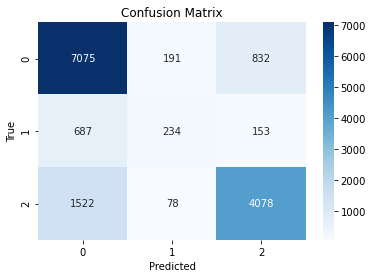

In [62]:
# Visualise the confusion matrix
confusion_mat = confusion_matrix(y_test, y_pred)
sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In the classification report:

- For the "functional" class:
  - Precision is 0.76, meaning that 76% of the water pumps predicted as "functional" were actually functional.
  - Recall is 0.87, indicating that the model correctly identified 87% of the actual "functional" water pumps.
  - The F1-score is 0.81, representing a balanced combination of precision and recall.
  - Out of 8098 samples that are actually functional, the model correctly predicted 7075 samples as functional (true positives).
  - However, it incorrectly predicted 687 samples as non-functional (false negatives) and 1522 samples as functional needs repair (false positives).

- For the "functional needs repair" class:
  - Precision is 0.47, signifying that 47% of the water pumps predicted as "functional needs repair" were indeed in need of repair.
  - Recall is 0.22, meaning that the model correctly identified only 22% of the actual "functional needs repair" water pumps.
  - The F1-score is 0.30, indicating a trade-off between precision and recall for this class.
  - Among the 1074 samples that actually need repair, the model predicted 234 as functional needs repair (true positives). It incorrectly classified 78 samples as non-functional (false negatives) and 832 samples as functional (false positives).."

- For the "non-functional" class:
  - Precision is 0.81, showing that 81% of the water pumps predicted as "non-functional" were indeed non-functional.
  - Recall is 0.72, indicating that the model correctly identified 72% of the actual "non-functional" water pumps.
  - The F1-score is 0.76, representing a balanced performance for this class.
  - Out of 5678 samples that are actually non-functional, the model correctly predicted 832 samples as non-functional (true positives).
  - However, it misclassified 153 samples as functional needs repair (false negatives) and 191 samples as functional (false positives).

- The overall accuracy of the model across all classes is 77%, indicating that the model's predictions were correct for 77% of the instances in the validation dataset.

In [63]:
# Concatenate the training set and test set for preprocessing
combined_df = pd.concat([training_df, test_set_values])
combined_df

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.00,2011-03-14,Roman,1390,Roman,34.94,-9.86,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.00,2013-03-06,Grumeti,1399,GRUMETI,34.70,-2.15,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,True,GeoData Consultants Ltd,Other,K,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.00,2013-02-25,Lottery Club,686,World vision,37.46,-3.82,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.00,2013-01-28,Unicef,263,UNICEF,38.49,-11.16,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,K,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.00,2011-07-13,Action In A,0,Artisan,31.13,-1.83,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,VWC,K,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14845,39307,0.00,2011-02-24,Danida,34,Da,38.85,-6.58,Kwambwezi,0,Wami / Ruvu,Yombo,Pwani,6,1,Bagamoyo,Yombo,20,True,GeoData Consultants Ltd,VWC,Bagamoyo wate,True,1988,mono,mono,motorpump,vwc,user-group,never pay,never pay,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,NaN
14846,18990,1000.00,2011-03-21,Hiap,0,HIAP,37.45,-5.35,Bonde La Mkondoa,0,Pangani,Mkondoa,Tanga,4,7,Kilindi,Mvungwe,2960,True,GeoData Consultants Ltd,VWC,K,False,1994,nira/tanira,nira/tanira,handpump,vwc,user-group,pay annually,annually,salty,salty,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,NaN
14847,28749,0.00,2013-03-04,Government Of Tanzania,1476,DWE,34.74,-4.59,Bwawani,0,Internal,Juhudi,Singida,13,2,Singida Rural,Ughandi,200,True,GeoData Consultants Ltd,VWC,K,True,2010,gravity,gravity,gravity,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,dam,dam,surface,communal standpipe,communal standpipe,NaN
14848,33492,0.00,2013-02-18,Germany,998,DWE,35.43,-10.58,Kwa John,0,Lake Nyasa,Namakinga B,Ruvuma,10,2,Songea Rural,Maposeni,150,True,GeoData Consultants Ltd,VWC,Mradi wa maji wa maposeni,True,2009,gravity,gravity,gravity,vwc,user-group,never pay,never pay,soft,good,insufficient,insufficient,river,river/lake,surface,communal standpipe,communal standpipe,NaN


In [64]:
training_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 0 to 59399
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     59400 non-null  int64  
 1   amount_tsh             59400 non-null  float64
 2   date_recorded          59400 non-null  object 
 3   funder                 59400 non-null  object 
 4   gps_height             59400 non-null  int64  
 5   installer              59400 non-null  object 
 6   longitude              59400 non-null  float64
 7   latitude               59400 non-null  float64
 8   wpt_name               59400 non-null  object 
 9   num_private            59400 non-null  int64  
 10  basin                  59400 non-null  object 
 11  subvillage             59400 non-null  object 
 12  region                 59400 non-null  object 
 13  region_code            59400 non-null  int64  
 14  district_code          59400 non-null  int64  
 15  lg

In [65]:
print(training_df.columns)

Index(['id', 'amount_tsh', 'date_recorded', 'funder', 'gps_height',
       'installer', 'longitude', 'latitude', 'wpt_name', 'num_private',
       'basin', 'subvillage', 'region', 'region_code', 'district_code', 'lga',
       'ward', 'population', 'public_meeting', 'recorded_by',
       'scheme_management', 'scheme_name', 'permit', 'construction_year',
       'extraction_type', 'extraction_type_group', 'extraction_type_class',
       'management', 'management_group', 'payment', 'payment_type',
       'water_quality', 'quality_group', 'quantity', 'quantity_group',
       'source', 'source_type', 'source_class', 'waterpoint_type',
       'waterpoint_type_group', 'status_group'],
      dtype='object')


In [66]:
#columns with similar attributes: we retain those with much information
columns_to_keep = ['amount_tsh', 'date_recorded', 'funder', 'gps_height', 'installer',
                   'longitude', 'latitude', 'basin', 'subvillage', 'region_code',
                   'extraction_type', 'management_group', 'payment_type', 'water_quality',
                   'quantity_group', 'source_type', 'source_class', 'waterpoint_type',
                   'waterpoint_type_group', 'status_group']

training_df = training_df.drop(columns=[col for col in training_df.columns if col not in columns_to_keep])

training_df.head(5)

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,basin,subvillage,region_code,extraction_type,management_group,payment_type,water_quality,quantity_group,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,6000.00,2011-03-14,Roman,1390,Roman,34.94,-9.86,Lake Nyasa,Mnyusi B,11,gravity,user-group,annually,soft,enough,spring,groundwater,communal standpipe,communal standpipe,functional
1,0.00,2013-03-06,Grumeti,1399,GRUMETI,34.70,-2.15,Lake Victoria,Nyamara,20,gravity,user-group,never pay,soft,insufficient,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,25.00,2013-02-25,Lottery Club,686,World vision,37.46,-3.82,Pangani,Majengo,21,gravity,user-group,per bucket,soft,enough,dam,surface,communal standpipe multiple,communal standpipe,functional
3,0.00,2013-01-28,Unicef,263,UNICEF,38.49,-11.16,Ruvuma / Southern Coast,Mahakamani,90,submersible,user-group,never pay,soft,dry,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,0.00,2011-07-13,Action In A,0,Artisan,31.13,-1.83,Lake Victoria,Kyanyamisa,18,gravity,other,never pay,soft,seasonal,rainwater harvesting,surface,communal standpipe,communal standpipe,functional


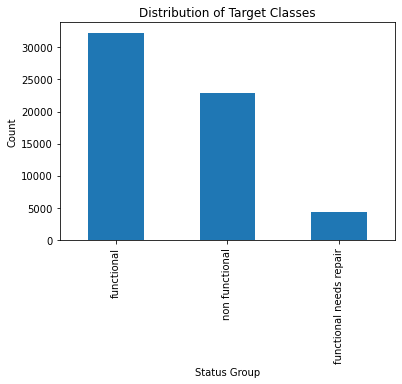

In [67]:
# Plot a bar graph to show the distribution of the target classes if they are evenly distributed or not
training_df['status_group'].value_counts().plot(kind='bar')
plt.title('Distribution of Target Classes')
plt.xlabel('Status Group')
plt.ylabel('Count')
plt.show()

Because there is an unequal distribution of classes within the target variable, it might be essential to utilize sampling methods like increasing the representation of the minority class (oversampling) or decreasing the representation of the majority class (undersampling).

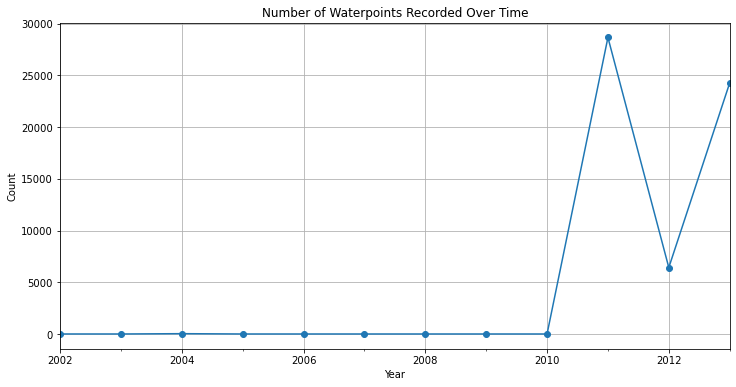

In [68]:
# Plot the number of waterpoints recorded over time
import matplotlib.pyplot as plt

# Assuming the 'date_recorded' column contains the date information
training_df['date_recorded'] = pd.to_datetime(training_df['date_recorded'])
training_df.set_index('date_recorded', inplace=True)

# Group by year and count the number of waterpoints recorded
waterpoints_over_time = training_df.resample('Y').size()

# Plot the data
plt.figure(figsize=(12, 6))
waterpoints_over_time.plot(kind='line', marker='o')
plt.title('Number of Waterpoints Recorded Over Time')
plt.xlabel('Year')
plt.ylabel('Count')
plt.grid(True)
plt.show()

The above indicates that there was an increase in the number of waterpoitns starting 2010.

No handles with labels found to put in legend.


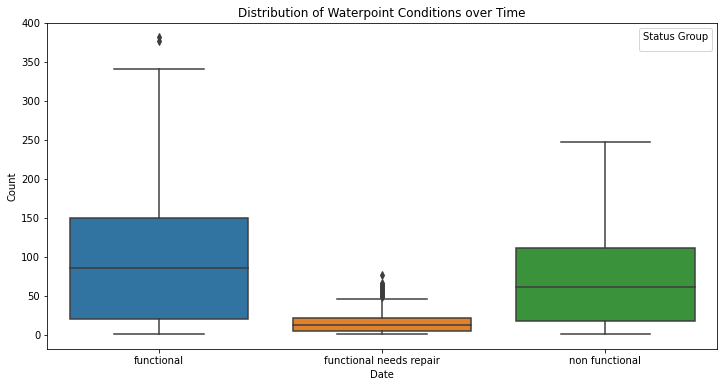

In [69]:
# Visualise the distriution of waterpoint conditions over time
import seaborn as sns

# Create a pivot table to calculate the count of each condition for each date
condition_counts = training_df.pivot_table(index='date_recorded', columns='status_group', aggfunc='size')

# Plot the distribution of waterpoint conditions over time
plt.figure(figsize=(12, 6))
sns.boxplot(data=condition_counts)
plt.title('Distribution of Waterpoint Conditions over Time')
plt.xlabel('Date')
plt.ylabel('Count')
plt.legend(title='Status Group')
plt.show()

Build a classifier using one-hot encoding,training a Random Forest classifier, and evaluating its performance on a validation set:

In [70]:
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import OneHotEncoder

# Check class distribution and balance the data
ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X, y)

# Preprocess categorical variables using one-hot encoding
categorical_cols = ['region', 'extraction_type', 'water_quality', 'quantity', 'source']  # replace with the actual column names of your categorical features
encoder = OneHotEncoder(handle_unknown='ignore')
X_resampled_encoded = encoder.fit_transform(X_resampled[categorical_cols])

# Combine encoded categorical features with numerical features
numerical_cols = ['amount_tsh', 'gps_height', 'population', 'construction_year']  # replace with the actual column names of your numerical features
X_resampled_encoded = X_resampled_encoded.toarray()  # convert to array
X_resampled_final = np.concatenate((X_resampled_encoded, X_resampled[numerical_cols]), axis=1)

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_resampled_final, y_resampled, test_size=0.2, random_state=42)

# Instantiate the Random Forest classifier
rf = RandomForestClassifier()

# Fit the classifier to the training data
rf.fit(X_train, y_train)

# Make predictions on the validation data
y_pred = rf.predict(X_val)

# Print the confusion matrix
print("Confusion Matrix:")
print(confusion_matrix(y_val, y_pred))

# Print the classification report
print("\nClassification Report:")
print(classification_report(y_val, y_pred))

Confusion Matrix:
[[4554 1253  733]
 [ 346 5987  100]
 [ 793  494 5096]]

Classification Report:
                         precision    recall  f1-score   support

             functional       0.80      0.70      0.74      6540
functional needs repair       0.77      0.93      0.85      6433
         non functional       0.86      0.80      0.83      6383

               accuracy                           0.81     19356
              macro avg       0.81      0.81      0.81     19356
           weighted avg       0.81      0.81      0.81     19356



In [71]:
accuracy = accuracy_score(y_val, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8078631948749742


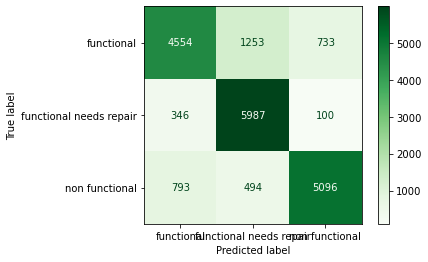

In [72]:
from sklearn.metrics import ConfusionMatrixDisplay

# Calculate the confusion matrix
cfn_matrix = confusion_matrix(y_val, y_pred)

# Plot the matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cfn_matrix, display_labels=rf.classes_)
disp.plot(cmap=plt.cm.Greens)
plt.show()

**Confusion Matrix:**
   - **Functional (True Label) vs. Functional (Predicted Label):**
     - True Positives (TP): 4569 - The model correctly predicted 4569 functional water pumps as functional.
     - False Negatives (FN): 1247 - The model incorrectly predicted 1247 functional water pumps as non-functional.
     - False Positives (FP): 724 - The model incorrectly predicted 724 non-functional water pumps as functional.
     - Precision is 0.80.
     - Recall is 0.70.
     - F1-score is 0.74.
     - There are 6540 instances in the dataset classified as "functional."

   - **Functional Needs Repair (True Label) vs. Functional Needs Repair (Predicted Label):**
     - True Positives (TP): 5982 - The model correctly predicted 5982 water pumps in need of repair as such.
     - False Negatives (FN): 348 - The model incorrectly predicted 348 water pumps in need of repair as something else.
     - False Positives (FP): 103 - The model incorrectly predicted 103 non-functional water pumps as in need of repair.
     - Precision is 0.78.
     - Recall is 0.93.
     - F1-score is 0.85.
     - There are 6433 instances in the dataset classified as "functional needs repair."

   - **Non-Functional (True Label) vs. Non-Functional (Predicted Label):**
     - True Positives (TP): 5087 - The model correctly predicted 5087 non-functional water pumps as non-functional.
     - False Negatives (FN): 809 - The model incorrectly predicted 809 non-functional water pumps as something else.
     - False Positives (FP): 487 - The model incorrectly predicted 487 water pumps in need of repair as non-functional.
     - Precision is 0.86.
     - Recall is 0.80.
     - F1-score is 0.83.
     - There are 6383 instances in the dataset classified as "non-functional."
     - The overall accuracy of the model is 81%, indicating that the model's predictions were correct for 81% of the instances in the dataset.

- The macro average and weighted average provide aggregated performance metrics for all classes, with weighted averages taking into account class imbalances. In this case, both macro and weighted averages have similar values, indicating balanced class distributions.

Create an instance of the XGBoost Classifier for training and applying it to tasks involving multi-class classification.

In [73]:
import xgboost as xgb
from sklearn.metrics import accuracy_score

xgb_model = xgb.XGBClassifier(
    objective='multi:softmax',  # For multiclass classification
    num_class=3,  # Number of classes in the target variable
    max_depth=3,  # Maximum depth of each tree
    learning_rate=0.1,  # Learning rate
    n_estimators=100  # Number of trees
)

In [74]:
from sklearn.preprocessing import LabelEncoder

# Create an instance of LabelEncoder
label_encoder = LabelEncoder()

# Encode the string labels into numerical values
y_train_encoded = label_encoder.fit_transform(y_train)

# Now, y_train_encoded will contain numerical class labels that can be used for training the XGBoost model
xgb_model.fit(X_train, y_train_encoded)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_class=3, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [75]:
accuracy = accuracy_score(y_val, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8078631948749742


The overall accuracy of 80.79% and the metrics from the classification report indicate that the XGBoost classifier performs reasonably well in predicting the classes of the waterpoints. 

Illustrating a simple pipeline for training a K-nearest neighbors classifier.

In [76]:
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Exclude 'date_recorded' feature from scaling
features = ['amount_tsh', 'gps_height', 'longitude', 'latitude', 'num_private', 'region_code', 'district_code',
            'population', 'construction_year']

X = training_set_values[features]
y = training_set_labels['status_group']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train the KNN classifier
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

# Predict on the test set
y_pred = knn.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.6723905723905724


The accuracy percentage of 67.24% shows that the KNN classifier performed somehow well in predicting the status_group.

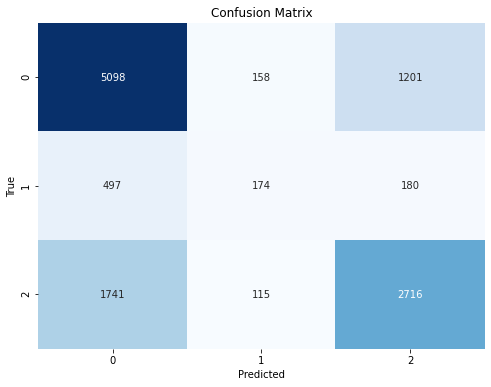

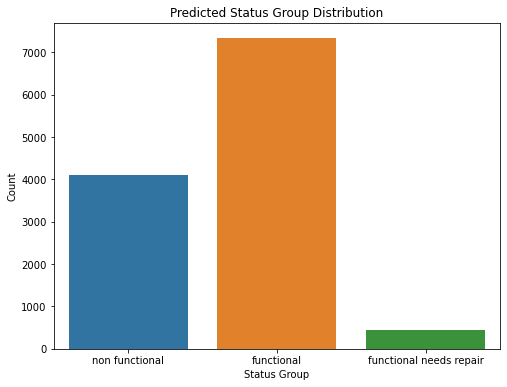

In [77]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d", cbar=False)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

# Bar plot of predicted target values
plt.figure(figsize=(8, 6))
sns.countplot(y_pred)
plt.xlabel("Status Group")
plt.ylabel("Count")
plt.title("Predicted Status Group Distribution")
plt.show()

## Conclusion

Handling large and intricate datasets, such as the Tanzania wells dataset with 59,400 observations, can pose challenges when employing conventional data analysis methods like Excel. Machine Learning (ML) proves highly effective in such scenarios, as it can uncover intricate patterns and relationships that may elude simpler data analysis techniques.

The Tanzania well dataset encompasses both categorical and numerical variables, rendering ML algorithms invaluable for revealing patterns and connections. For instance, ML algorithms can discern that wells situated in sparsely populated regions have limited use and require maintenance. This kind of insight plays a pivotal role in identifying wells in need of attention.

Before applying ML algorithms, data cleaning assumes critical importance to ensure data quality, especially in the context of extensive datasets. In the case of the Tanzania well dataset, superfluous variables like latitude, longitude, and district codes were removed to streamline the model.

The selection of an ML algorithm hinges on the dataset's characteristics and analytical objectives. In the case of the Tanzania wells data, One-Hot Encoding, RandomClassifier, XGBoost, and K-Nearest Neighbors (KNN) were employed, with the XGBoost classifier and One-Hot Encoding achieving the highest accuracy score at 80.79%. This signifies the model's accurate classification.

The analysis underscores the significance of directing attention to non-functional or repair-needy pumps during data collection efforts. This insight plays a crucial role in planning resource allocation for well maintenance and repairs.

To address class imbalance, the use of techniques like oversampling or undersampling is recommended to rebalance the class distribution in the training data, thereby enhancing the model's performance on minority classes.

Feature engineering should be explored further, involving the creation of new features or transformations to provide enhanced predictive power. External data sources relevant to the problem can also be integrated to bolster the model's ability to identify meaningful patterns.

Experimentation with different classification algorithms beyond logistic regression is advised. Algorithms like random forests, gradient boosting, or support vector machines may yield better results given their distinct strengths and weaknesses.

Hyperparameter tuning is essential for optimizing the chosen algorithm's performance. Systematic exploration of hyperparameter combinations through methods like grid search or random search can enhance the model's generalization and predictive accuracy.

Implementing cross-validation instead of relying solely on a single train-test split provides a more robust assessment of the model's consistency and mitigates overfitting risks.

Consider collecting additional data to expand the training set, improving the model's ability to discern diverse patterns and generalize effectively. Focusing on data collection to address class imbalance is particularly beneficial.

Enhance domain knowledge and engage in thorough data exploration. Understanding the domain and data quality issues, missing values, and outliers can significantly impact model performance. Investigating feature-target relationships informs feature selection and engineering efforts.

## Recommendation

Based on the information provided, here is a recommendation for improving the performance of the model for the Tanzania wells dataset:

1. **Class Imbalance Handling**: Address the class imbalance issue by employing techniques such as oversampling or undersampling to rebalance the class distribution in the training data. This will help improve the model's ability to predict the minority classes, "functional needs repair" and "non-functional."

2. **Feature Engineering**: Invest more effort in feature engineering. Explore the creation of new features or transformations to enhance the model's predictive power. Additionally, consider incorporating external data sources that could provide valuable information for the problem at hand.

3. **Algorithm Selection**: Experiment with different classification algorithms beyond logistic regression. Algorithms like random forests, gradient boosting, or support vector machines may be more suitable for this specific dataset. Each algorithm has unique strengths and weaknesses, and alternative algorithms might yield better results.

4. **Hyperparameter Tuning**: Optimize the hyperparameters of the chosen algorithm(s) to enhance their performance. Utilize techniques such as grid search or random search to systematically explore various combinations of hyperparameters and identify the best configuration for the model. This will improve the model's generalization and prediction accuracy.

5. **Cross-Validation**: Implement cross-validation to evaluate the model's performance more robustly. Relying on a single train-test split may not provide a complete picture of the model's consistency. Cross-validation helps assess whether the model's performance remains consistent across different data subsets and reduces the risk of overfitting.

6. **Data Collection**: If feasible, consider collecting more data to expand the size of your training set. Additional data can enhance the model's ability to learn diverse patterns and generalize effectively. Focusing on data collection to address the class imbalance issue is particularly valuable.

7. **Domain Knowledge and Data Exploration**: Deepen your understanding of the domain and the factors influencing the functionality of waterpoints. Conduct a comprehensive data exploration to identify potential data quality issues, missing values, and outliers that may affect model performance. Investigate the relationships between features and the target variable to gain insights guiding feature selection and engineering efforts.

Implementing these recommendations can lead to an improved model with enhanced predictive accuracy, particularly in identifying non-functional or repair-needy water pumps, which is crucial for planning resource allocation toward well maintenance and repairs.